In [1]:
from google.colab import files

In [2]:
files.upload()

Saving Avengers.jpg to Avengers.jpg


{'Avengers.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x02\x00v\x00v\x00\x00\xff\xdb\x00C\x00\x06\x04\x05\x06\x05\x04\x06\x06\x05\x06\x07\x07\x06\x08\n\x10\n\n\t\t\n\x14\x0e\x0f\x0c\x10\x17\x14\x18\x18\x17\x14\x16\x16\x1a\x1d%\x1f\x1a\x1b#\x1c\x16\x16 , #&\')*)\x19\x1f-0-(0%()(\xff\xdb\x00C\x01\x07\x07\x07\n\x08\n\x13\n\n\x13(\x1a\x16\x1a((((((((((((((((((((((((((((((((((((((((((((((((((\xff\xc2\x00\x11\x08\x04\xc4\x024\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x01\x05\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x01\x03\x04\x05\x06\x07\x08\xff\xc4\x00\x1a\x01\x00\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x00\x01\xe4Z\x86\xbf\xb9\x9e\x02\x980\xa8BP\xe5#\x19\x03\x9d\x8b;*\xb5UK\xa4\xc0\x92\xc5\xc8\x12\x05\x86\xf1\xcfH\x1d\xc6\xe4\x9eUN\x11\x900l\xcc\xd2\xc9\x0b\x83\xa4\x90\x92@\x99\xd9\xb4\x92\x04\x92\x04\xce\xc0\x92@\x92@\x92@\x92@\x92@\x92LI I\x9c\x12HI$

In [3]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [4]:
img = cv2.imread('Avengers.jpg', cv2.IMREAD_COLOR)

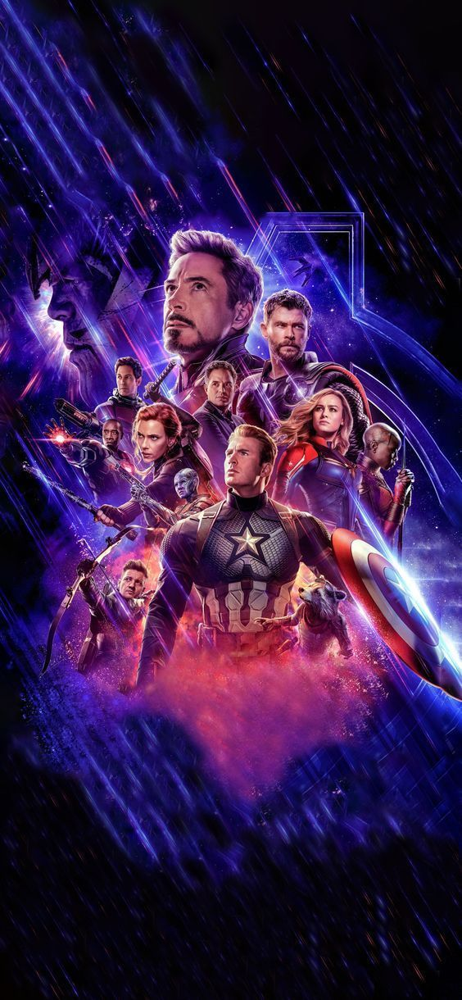

In [5]:
cv2_imshow(img)

In [ ]:
img.shape[: 2]

(1220, 564)

In [6]:
#Transformation without frame adjustments. Corners of the image are lost.

h, w = img.shape[: 2]

cy, cx = h/2, w/2

M = cv2.getRotationMatrix2D((cx, cy), 15, 1)

dst = cv2.warpAffine(img, M, (w, h))

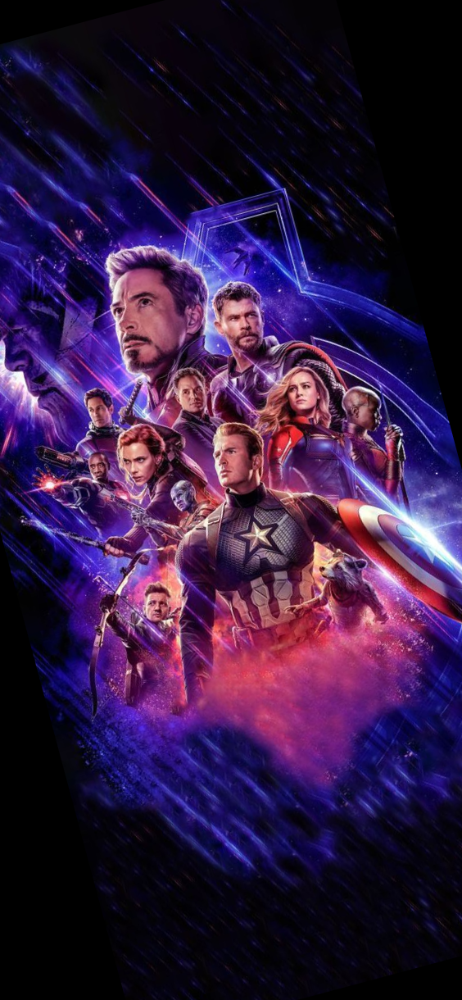

In [7]:
cv2_imshow(dst)

In [8]:
def rotate_with_frame_adjustments(img, angle) :

  h, w = img.shape[: 2]                                     #Height and Width of the image.

  cy, cx = h/2, w/2                                         #Center of the image.

  M = cv2.getRotationMatrix2D((cx, cy), angle, 1)           #Gives the cosine, sine of the angle and, the new height and width of the image.

  cos = abs(M[0, 0])                                        #Cosine of the given angle.
  sin = abs(M[0, 1])                                        #Sine of the given angle.

  new_w = int((w*cos)+(h*sin))                              #Gives the new width of the frame to fit the rotated image.
  new_h = int((h*cos)+(w*sin))                              #Gives the new width of the frame to fit the rotated image.

  M[0, 2] += (new_w/2)-cx                                   #New center of the image(X-coordinate).
  M[1, 2] += (new_h/2)-cy                                   #New center of the image(Y-coordinate).

  trans_img = cv2.warpAffine(img, M, (new_w, new_h))        #Transformation function.

  return trans_img

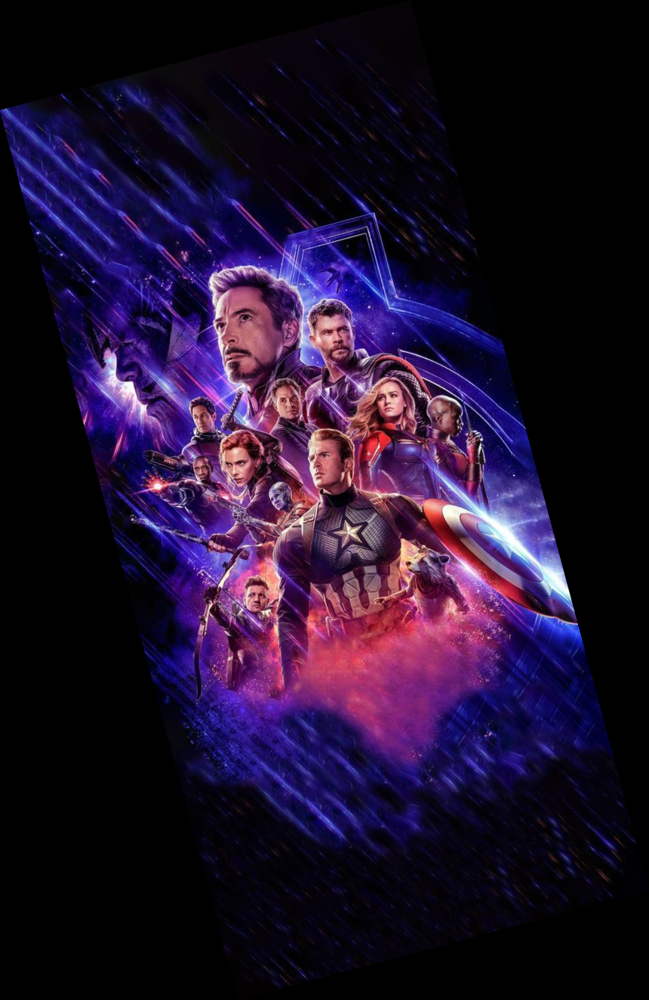

In [10]:
cv2_imshow(rotate_with_frame_adjustments(img, 15))

In [11]:
files.upload()

Saving Screenshot (231).png to Screenshot (231).png


{'Screenshot (231).png': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x07\x80\x00\x00\x048\x08\x06\x00\x00\x00\xe8\xd3\xc1C\x00\x00\x00\x01sRGB\x00\xae\xce\x1c\xe9\x00\x00\x00\x04gAMA\x00\x00\xb1\x8f\x0b\xfca\x05\x00\x00\xff\xbaIDATx^\xec\xfd[\xae-\xc9\xd2.\x08e\xee\xcc\x95\x7f+\x80\x07$x\x81\xe2V\x05\xa8\x90\xea\x01\x84\x04\xa2\x90\x00q\x11%UQB \x81\x10\x12M\xf8{E\x13\xe8\x02M9\xa7v\xe6N\xec\xbb\x99\x99G\xc4\x18s\xae\xcc\xdc\xb7\xc3\xfa"\xcc\xed\xea\xe6\xe6\x1e1b\xc4\x8c\x98s\xad\xef\xff\x1f\xff\xd9\x7f\xf8\xebw\x9f\xc4\xf7n\xbf\x87P\x8dX\xb5\x96\x01\xe8\xb1\xfd\t\xf4\xa7?Q\xff\xd3\x0f?|\xf7C\xc9\x7f\xfa\xd3\x0f\x87\xfcC\xc9\xe2?~\xf7\xe5\xcb\x97\xa2\x9fH\xdf\x7f_~\xe6\xfaS\xe7\xad\x96\x9c\xa3Q/T\xf5\x98\xc0_\xfe\xf2k\xd1_H\xbf\xfe\xfakQ\xf1\xb2\xf5\xe4\x10w\x10b\x8a\xff\xa5\x08n6\xdf\x1f~v\x13\xe3\x98\x99Wj\x80J\xb7:#\x886\x91\xfc\xdf\xff\xe9\xfb\xaa\xe9\x17\xd5U\xfc\x17\xca\xa2_~\x01\xfd,\x1b\xe4\xbf\x94\\<~\xf4\xa9\x99\xb1\x96\x9a\x1dFb\xce\xf0\x10\xc7]64\xe4\x84&0:d\xd7\x06\xc2q\

In [12]:
maxwell = cv2.imread('Screenshot (231).png', cv2.IMREAD_COLOR)

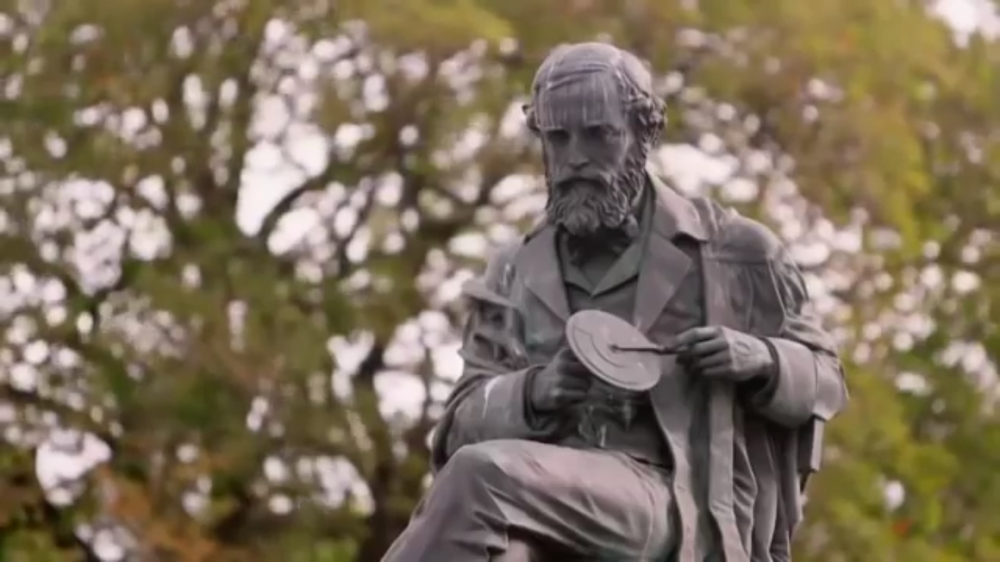

In [13]:
cv2_imshow(maxwell)

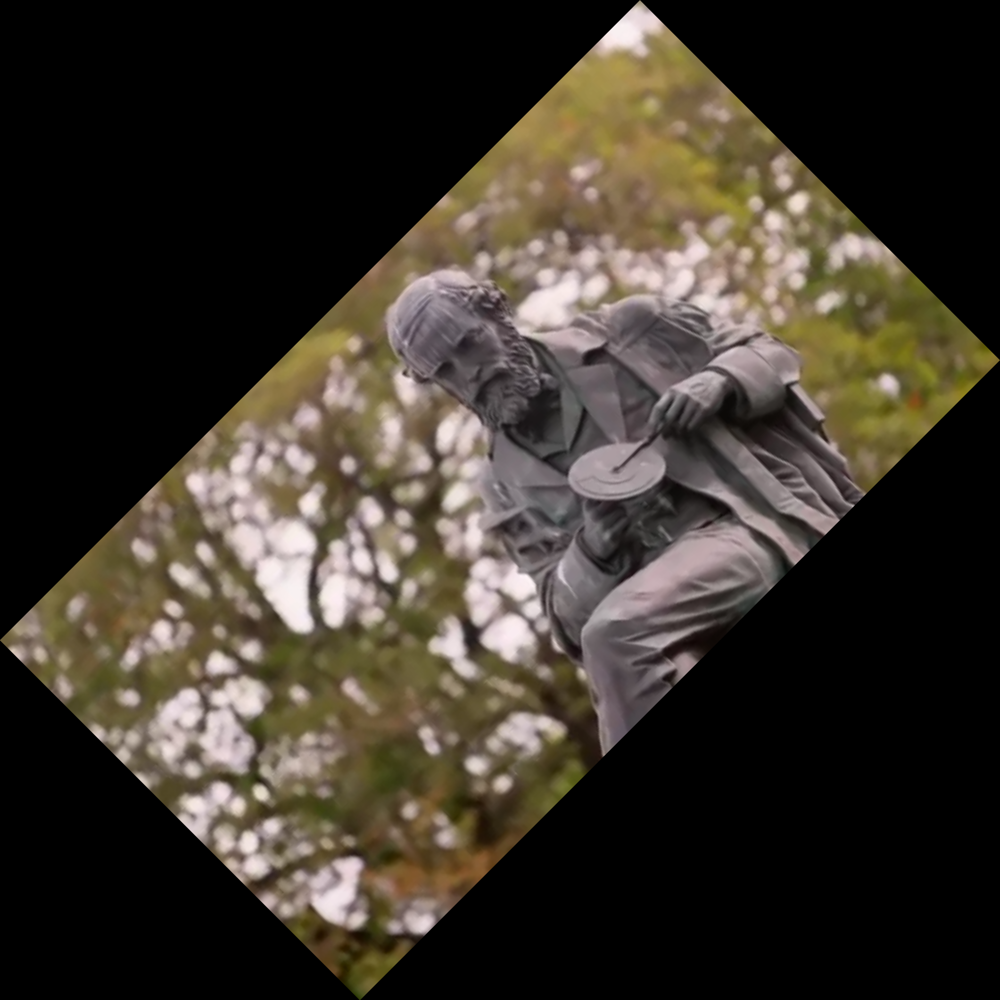

In [18]:
cv2_imshow(rotate_with_frame_adjustments(maxwell, 45))

In [ ]:
cv2.imwrite('trans_img.png', trans_img)

True